# Assignment 3. YouTube Dashboard

# Overview
For this assignment, I wanted to dig into the world of YouTube and downloaded the Kaggle dataset called <b>Trending YouTube Video Statistics</b>, available at [Kaggle](https://www.kaggle.com/datasets/datasnaek/youtube-new). This is a great public dataset for the media world, which is the industry I work in.

Here are some interesting highlights about this dataset:
* <b>Daily trending data</b>: I wanted to ensure that the dataset was rich enough to do interesting stuff with. The data captures the top ~200 trending YouTube videos each day across multiple countries, including titles, channel names, publication timestamps, category IDs, tags, view counts, likes/dislikes, comment counts, and more
* <b>Multi-country coverage</b>: I figured it would be interesting to take a look at behavior across countries. This dataset includes datasets for regions like the USA, Great Britain, Canada, India, Japan, etc., each maintained separately—facilitating both local and global trend analysis. Though I eventually realized that the most interesting cut would be to analyze trends across countries with the same primary language -- so I limited the data analysis to US, Canada and Great Britain (unfortunately, Australia wasn't available)
* <b>Rich metadata for each video</b>: I wanted to be able to look at both aggregate trends, but drill into individual data points when needed, say, with a scatterplot. In addition to numerical metrics (views, likes, dislikes, comments), it provides descriptive data such as the video title, channel name, publish time, and tags—allowing for both quantitative and qualitative insights
* <b>Trends over time</b>: I really wanted to do something longitudinal for the line chart. Because videos often trend for multiple days, the dataset enables tracking of prominence trajectories, e.g., how long a video remains trending or how engagement evolves day by day.

It's an intriguing dataset that lets us dig into the characteristics of videos that go viral on YouTube. Let's dive in!

---
# Installations

There was a lot of experimentation and research I did before deciding on the library I wanted to use for this assignment. I wanted a set of libraries that have been proven to work within the Vocareum JupyterLab environment -- since I know the university has had its share of issues with it. 

Since we are not suppose to use Matplotlib or Altair for this, I primarily weighed between Plotly and Seaborn. I read that Seaborn was primarily static, and wasn't as easy to integrate with interactive widget controls from ipywidget or Panel, and I really wanted to try my hand at an altogether unfamiliar library, so I decided to go with Plotly for charting.

For dashboarding and interactive widgetry, I went with Panel. Panel allowed for finer-grained control and had a more modern approach compared to ipywidget, and also read that the Bokeh integration was seamless, since both Panel and Bokeh were produced by the same team. Bokeh is the Python interactive visualization library that powers tools like Panel, giving us rich browser-based visualization (something I unfortunatey had trouble getting working within the Vocareum environment) and dashboards. 

## Library Summary
So in summary, I went with
* Plotly for Static Charts
* Panel for Dashboarding
* Panel for interactive widgetry

<b>Plotly 5.18.0</b>: This version of Plotly is considered very stable and widely used. To be honest, I started with Plotly 6.x, but found that it wasn't rendering anything in the notebook, even though it didn't throw any errors. Newer versions were also running into dependency issues with Kaleido, which is used by Plotly to export static images (.jpgs, .pngs, ...) from interactive figures, and I could simply not set it all up to work within Vocareum (something to raise with the Vocareum team!)
* **Developed by**: [Plotly Inc](https://plotly.com/)
* **Open source**? Yes, under the MIT license
* **General Approach**: a Javascript plotting library with Python bindings
* **Type**: Declarative
* **Jupyter Integrations**: Yes, native integrations that work with classic Notebooks, JupyterLab and CoLab
* **Advantages**: Charting felt a lot more feature-rich, with default filtering mechanisms and rich hoverstates (I'll demo that later)
* **Limitations**: Image exports require kaleido, and more modern varsions had compatibility issues within Vocareum


<b>Panel</b>: Panel was covered in some of the more advanced videos, and I wanted to play around with it. As stated, we'll need Panel for the widgetry and dashboarding. The default styling also doesn't seem as slick as the others
* **Developed by**: [Holoviz.org](https://holoviz.org/)
* **Open source**: Yes, under the BSD 3-Clause license
* **General approach**: a dashboarding framework for Python, designed to work with a wide range of plotting libraries
* **Type**: Declarative when using the @pn.depends decorator or pn.bind, procedural for callbacks such as .on_click()
* **Jupyter Integrations**: Yes, integrates well with Classic Notebooks and JupyterLab (requires pn.extension())
* **Advantages**: Can view dashboards inline or as standalone web apps. Has a rich layout and composition system and works well for both reactive (auto-updating) and event-driven(submit buttons). Thankfully! After building my dashboard, I found the reactive version too slow, and switched to the event-driven model
* **Limitations**: Harder to learn versus ipywidgets. The decorator and .bind() operation wasn't the most intuitive.


<b>ipywidgets</b>: Even if I am using Panel, I still needed to import the ipywidget library because Jupyter Notebook's front end requires it to render interactive widgets reliably, even if we're not explicitly using it in the code.
* **Developed by**: Jupyter Project, maintained by core contributors of Project Jupyter
* **Open source**: Yes, under the BSD license
* **General approach**: provides interactive widgets for controlling Python code in Jupyter notebooks
* **Type**: Procedural -- callback functions are attached manually (.observe, .on_click, ...)
* **Jupyter Integrations**: Yes, it is THE native widgeting system in Jupyter
* **Advantages**: Built by the Jupyter guys, so it's native, lightweight and simple.
* **Limitations**: Weak layout and composition system. It doesn't scale well for more complex dashboards or cross-library integrations



In [1]:
!pip install plotly==5.18.0 panel ipywidgets --upgrade

#!pip install plotly ipywidgets
#!pip install plotly==5.18.0
#!pip install jupyterlab_widgets ipywidgets ipykernel --upgrade


Defaulting to user installation because normal site-packages is not writeable


# Import and Setup

Here are all the libraries I used (including some that I brought in for debugging, such as pprint)

In [2]:
import pandas as pd
import numpy as np
import os
import json
import pprint

import plotly
import plotly.io as pio   # We're going to use Plotly for the charts
import plotly.graph_objs as go

import panel as pn        # We're going to use Panel for dashboarding

# Set default renderer for Plotly figures in notebooks.
# "iframe" ensures isolated, static rendering (more stable across environments),
# while "notebook_connected" enables dynamic interaction but can fail in restricted environments like Vocareum.
pio.renderers.default = "iframe"  

#display(pn.__version__)
pd.set_option('display.float_format', '{:.5f}'.format)   # I don't like Panda's default usage of scientific notation

/usr/local/lib/python3.12/site-packages/kaleido/__init__.py:14: UserWarning:




This means that static image generation (e.g. `fig.write_image()`) will not work.

Please upgrade Plotly to version 6.1.1 or greater, or downgrade Kaleido to version 0.2.1.




⚠️ Ignore the warning above.
I didn’t — and upgrading Plotly to 6.1.1 (as the warning suggested) introduced new issues that broke Panel compatibility and caused silent failures when rendering Plotly figures inside my dashboard. So despite the Kaleido warning, I stayed with Plotly 5.18.0, which works reliably with kaleido==0.2.1 in environments like Vocareum. Static image export isn’t a priority for this notebook — interactive exploration is.

I then downloaded the .zip file from [Kaggle's Trending YouTube Video Statistics page](https://www.kaggle.com/datasets/datasnaek/youtube-new) into the folder tree. The function below unzips it into a directory called youtube_data/. To speed up execution, I use the os library to detect the presence of the folder and skip the unzipping. 

In [3]:
import os

def unzip_files(file_path = "youtube_archive.zip", force=False):
    """
    Unzips a YouTube dataset archive if it hasn't already been extracted.

    Parameters:
    -----------
    file_path : str, optional (default="youtube_archive.zip")
        Path to the ZIP file containing the dataset.

    force : bool, optional (default=False)
        If True, will re-extract the archive even if the target directory exists.
        (Note: force behavior is not yet implemented in this version.)

    Behavior:
    ---------
    - If the "youtube_data/" directory already exists, the function does nothing.
    - If the ZIP file exists, it prints basic info about it.
    - If neither the directory nor the ZIP file is found, it prints an error message.

    Returns:
    --------
    None
    """
    if os.path.exists("youtube_data/"):
        print("Directory already exists")
        return    # No need to do anything since it's already been unzipped
    elif os.path.exists(file_path):
        print(f"File found: {file_path}")
        print(f"Size: {os.path.getsize(file_path) / 1024:.2f} KB")
    else:
        print("File not found.")

    return

unzip_files()


Directory already exists


# Country Inspections
I limited analysis to the US, Canda and Great Britain because they all share a common language, and I felt that behavioral comparisons of those videos would make the most sense. I also considered grouping them by the actual video and looking at only English-native countries felt like they would have the greatest overlap. I eventually considered not doing that because setting up the basic dashboard was already enough work! Nevertheless, it's an opportunity for future analysis.

Let's inspect the US dataset to see if there's any funny business.

In [4]:
# Let's first inspect the US file
import pandas as pd

us_df = pd.read_csv("youtube_data/USvideos.csv", encoding="latin1", parse_dates=["publish_time"])
display(us_df.dtypes)
display(us_df.info())
display(us_df.describe())

# Trending_date is in a weird format. Will need to parse that after TODO
us_df['trending_date'] = pd.to_datetime(us_df['trending_date'], format='%y.%d.%m')

# publish_time also appears to be backfilled -- we may want to truncate charts
# only to start at the earlier trend date recorded
display("Earliest date sample for trending:", us_df['trending_date'].min())

display(us_df.sample(5))
# Everything looks find -- let's read in the JSON file and join it


video_id                               object
trending_date                          object
title                                  object
channel_title                          object
category_id                             int64
publish_time              datetime64[ns, UTC]
tags                                   object
views                                   int64
likes                                   int64
dislikes                                int64
comment_count                           int64
thumbnail_link                         object
comments_disabled                        bool
ratings_disabled                         bool
video_error_or_removed                   bool
description                            object
dtype: object

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40949 entries, 0 to 40948
Data columns (total 16 columns):
 #   Column                  Non-Null Count  Dtype              
---  ------                  --------------  -----              
 0   video_id                40949 non-null  object             
 1   trending_date           40949 non-null  object             
 2   title                   40949 non-null  object             
 3   channel_title           40949 non-null  object             
 4   category_id             40949 non-null  int64              
 5   publish_time            40949 non-null  datetime64[ns, UTC]
 6   tags                    40949 non-null  object             
 7   views                   40949 non-null  int64              
 8   likes                   40949 non-null  int64              
 9   dislikes                40949 non-null  int64              
 10  comment_count           40949 non-null  int64              
 11  thumbnail_link          40949 non-null  o

None

,category_id,views,likes,dislikes,comment_count
count,40949.00000,40949.00000,40949.00000,40949.00000,40949.00000
mean,19.97243,2360784.63826,74266.70243,3711.40089,8446.80368
std,7.56833,7394113.75970,228885.33821,29029.70595,37430.48699
min,1.00000,549.00000,0.00000,0.00000,0.00000
25%,17.00000,242329.00000,5424.00000,202.00000,614.00000
50%,24.00000,681861.00000,18091.00000,631.00000,1856.00000
75%,25.00000,1823157.00000,55417.00000,1938.00000,5755.00000
max,43.00000,225211923.00000,5613827.00000,1674420.00000,1361580.00000


'Earliest date sample for trending:'

Timestamp('2017-11-14 00:00:00')

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description
20456,DFZmEaNqdNc,2018-02-26,Haul Video #2 | Tacos!,PESfilm,1,2018-02-22 22:34:29+00:00,"PES|""Taco""|""Haul Video""|""flea market""|""Long Be...",37244,1691,30,112,https://i.ytimg.com/vi/DFZmEaNqdNc/default.jpg,False,False,False,"In this episode, PES visits the Long Beach, CA..."
13384,T5ITSG6KGlc,2018-01-21,No victims as Boeing narrowly avoids plunge in...,euronews (in English),25,2018-01-14 14:30:14+00:00,"Boeing|""Plane crash""",1173312,3689,454,1604,https://i.ytimg.com/vi/T5ITSG6KGlc/default.jpg,False,False,False,Plane skidded off runway in northeastern Turke...
28419,aFMUPcuSsJs,2018-04-07,SodaSoak by SodaStream,SodaStream,24,2018-03-28 11:09:47+00:00,"Soda|""SodaStream""|""SodaSoak""|""Bubbles""|""Bath""|...",3105328,4275,1805,686,https://i.ytimg.com/vi/aFMUPcuSsJs/default.jpg,False,False,False,"Sparkling bubbles, dazzling bubbles or OHMYGOS..."
25525,0KRpcUAtg00,2018-03-23,Getting Turned On - Man Vs House Ep.#7,ThreadBanger,26,2018-03-11 00:05:42+00:00,"DIY|""threadbanger""|""Corinne Leigh""|""Rob Czar""|...",844109,40721,644,2132,https://i.ytimg.com/vi/0KRpcUAtg00/default.jpg,False,False,False,Lowe's got our cat a bath tub. Show them some ...
10733,tp6wtD9jGyA,2018-01-06,BEST Pho! TRADITIONAL Noodle Tour of Saigon Vi...,Strictly Dumpling,19,2017-12-31 17:44:53+00:00,"best pho|""best pho in vietnam""|""best vietnames...",419185,12331,220,1843,https://i.ytimg.com/vi/tp6wtD9jGyA/default.jpg,False,False,False,I've been wanting to travel to Vietnam for yea...


Nothing unusual here. Fortunately, uploading the .csv file did not result in any issues (I was especially worried about commas in the description field, especially since the native Vocareum CSV reader was parsing the file incorrectly, but it turns out (opening the file in Excel -- it opened properly!), the proper escape characters were included in the file, so the data was read properly into the dataframe.

I ran the sample() command several times to make 200% sure, and the .csv parsed nicely into the dataframe every time. Huzzah!

Now, let's take a look at the Canada file....

In [5]:
# Let's quickly inspect the Canada data

ca_df = pd.read_csv("youtube_data/CAvideos.csv", encoding="latin1", parse_dates=["publish_time"])
display(ca_df.dtypes)
display(ca_df.info())
display(ca_df.describe())

# Trending_date is in a weird format. Will need to parse that after TODO
ca_df['trending_date'] = pd.to_datetime(ca_df['trending_date'], format='%y.%d.%m')

# publish_time also appears to be backfilled -- we may want to truncate charts
# only to start at the earlier trend date recorded
display("Earliest date sample for trending:", ca_df['trending_date'].min())

# Final check
display(ca_df.sample(5))


video_id                               object
trending_date                          object
title                                  object
channel_title                          object
category_id                             int64
publish_time              datetime64[ns, UTC]
tags                                   object
views                                   int64
likes                                   int64
dislikes                                int64
comment_count                           int64
thumbnail_link                         object
comments_disabled                        bool
ratings_disabled                         bool
video_error_or_removed                   bool
description                            object
dtype: object

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40881 entries, 0 to 40880
Data columns (total 16 columns):
 #   Column                  Non-Null Count  Dtype              
---  ------                  --------------  -----              
 0   video_id                40881 non-null  object             
 1   trending_date           40881 non-null  object             
 2   title                   40881 non-null  object             
 3   channel_title           40881 non-null  object             
 4   category_id             40881 non-null  int64              
 5   publish_time            40881 non-null  datetime64[ns, UTC]
 6   tags                    40881 non-null  object             
 7   views                   40881 non-null  int64              
 8   likes                   40881 non-null  int64              
 9   dislikes                40881 non-null  int64              
 10  comment_count           40881 non-null  int64              
 11  thumbnail_link          40881 non-null  o

None

,category_id,views,likes,dislikes,comment_count
count,40881.00000,40881.00000,40881.00000,40881.00000,40881.00000
mean,20.79555,1147035.91079,39582.68824,2009.19545,5042.97471
std,6.77505,3390913.02231,132689.53074,19008.36979,21579.02065
min,1.00000,733.00000,0.00000,0.00000,0.00000
25%,20.00000,143902.00000,2191.00000,99.00000,417.00000
50%,24.00000,371204.00000,8780.00000,303.00000,1301.00000
75%,24.00000,963302.00000,28717.00000,950.00000,3713.00000
max,43.00000,137843120.00000,5053338.00000,1602383.00000,1114800.00000


'Earliest date sample for trending:'

Timestamp('2017-11-14 00:00:00')

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description
17164,7kLO2AB5SPM,2018-02-10,about Logan Paul,CaseyNeistat,22,2018-02-09 13:00:00+00:00,"logan paul casey neistat|""robert kyncl""|""youtu...",2768013,165858,9001,14577,https://i.ytimg.com/vi/7kLO2AB5SPM/default.jpg,False,False,False,excited to share this with all of you. immens...
35733,AaJ7zbuiNB0,2018-05-20,Meghan & her proud mom spend final emotional n...,Royal Insider,25,2018-05-18 22:19:36+00:00,"Meghan|""Markle""|""proud""|""mother""|""Doria""|""Ragl...",296448,1489,201,450,https://i.ytimg.com/vi/AaJ7zbuiNB0/default.jpg,False,False,False,Meghan Markle and her mother Doria Ragland wil...
37912,RGNAAQbdJm0,2018-05-31,50 Facts You Didn't Know About Sanjay Dutt | S...,5ocial,24,2018-05-30 10:50:51+00:00,"Sanjay Dutt Old Interview|""Sanjay Dutt""|""Sanju...",784518,15792,644,598,https://i.ytimg.com/vi/RGNAAQbdJm0/default.jpg,False,False,False,This time 5ocial brings you a fact finding vid...
2965,WywY79twjV4,2017-11-28,MAHDI BA VS TEAM S3,Mahdi Ba,24,2017-11-27 17:30:34+00:00,"mahdi ba|""foot""|""freestyle""|""s3""",127344,11208,82,308,https://i.ytimg.com/vi/WywY79twjV4/default.jpg,False,False,False,ãâªï¼³ï¼³ã ï¼³ã¥ä¸¹ãã¢å°º\nJ'espÃ¨re ...
31571,RoflWNvJg_w,2018-04-29,"Por primera vez, Daddy Yankee, Natti Natasha y...",Telemundo Entretenimiento,24,2018-04-27 18:49:21+00:00,"Premios Billboard|""msn""|""premios billboard de ...",2906701,60963,3133,2463,https://i.ytimg.com/vi/RoflWNvJg_w/default.jpg,False,False,False,Video ofician de Telemundo Premios Billboard. ...


This file also parsed well after several inspections with the sample() function. Interestingly, the number of rows in the dataframe are similar to the US -- but I didn't realize that the dataset automatically picked up the top 200 trending videos (not ALL "trending" video -- whatever "trending" meant for Google) for each country, which would explain why they all ended up relatively the same size.

Now let's look at Great Britain's... I'm sure it'll be all right.

In [6]:
# Finally, let's bring in GB

gb_df = pd.read_csv("youtube_data/GBvideos.csv", encoding="latin1", parse_dates=["publish_time"])
display(gb_df.dtypes)
display(gb_df.info())
display(gb_df.describe())

# Trending_date is in a weird format. Will need to parse that after TODO
gb_df['trending_date'] = pd.to_datetime(gb_df['trending_date'], format='%y.%d.%m')

# publish_time also appears to be backfilled -- we may want to truncate charts
# only to start at the earlier trend date recorded
display("Earliest date sample for trending:", gb_df['trending_date'].min())

# Final check
display(gb_df.sample(5))


video_id                               object
trending_date                          object
title                                  object
channel_title                          object
category_id                             int64
publish_time              datetime64[ns, UTC]
tags                                   object
views                                   int64
likes                                   int64
dislikes                                int64
comment_count                           int64
thumbnail_link                         object
comments_disabled                        bool
ratings_disabled                         bool
video_error_or_removed                   bool
description                            object
dtype: object

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38916 entries, 0 to 38915
Data columns (total 16 columns):
 #   Column                  Non-Null Count  Dtype              
---  ------                  --------------  -----              
 0   video_id                38916 non-null  object             
 1   trending_date           38916 non-null  object             
 2   title                   38916 non-null  object             
 3   channel_title           38916 non-null  object             
 4   category_id             38916 non-null  int64              
 5   publish_time            38916 non-null  datetime64[ns, UTC]
 6   tags                    38916 non-null  object             
 7   views                   38916 non-null  int64              
 8   likes                   38916 non-null  int64              
 9   dislikes                38916 non-null  int64              
 10  comment_count           38916 non-null  int64              
 11  thumbnail_link          38916 non-null  o

None

,category_id,views,likes,dislikes,comment_count
count,38916.00000,38916.00000,38916.00000,38916.00000,38916.00000
mean,16.82794,5911943.62663,134519.55350,7612.55998,13088.35315
std,7.75273,19001209.95422,349989.30792,50956.83362,50667.39962
min,1.00000,851.00000,0.00000,0.00000,0.00000
25%,10.00000,251527.25000,5897.00000,200.00000,679.00000
50%,20.00000,981889.00000,25182.50000,821.00000,2478.00000
75%,24.00000,3683628.50000,114089.25000,3357.50000,9241.50000
max,43.00000,424538912.00000,5613827.00000,1944971.00000,1626501.00000


'Earliest date sample for trending:'

Timestamp('2017-11-14 00:00:00')

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description
16175,ip_r4y-23JM,2018-02-04,The Fall Hip Priest,P23BenBousquet,22,2008-12-19 18:03:01+00:00,"The|""Fall""|""Hip""|""Priest""",45175,255,3,51,https://i.ytimg.com/vi/ip_r4y-23JM/default.jpg,False,False,False,The Fall Hip Priest
28403,aRsOBFhNjVM,2018-04-07,Steamed Hams Inc.,NPCarlsson,24,2018-03-05 18:30:03+00:00,"YouTube Poop|""YTP""|""Animation""|""Music""|""Gaming...",1674134,88854,538,6268,https://i.ytimg.com/vi/aRsOBFhNjVM/default.jpg,False,False,False,I'm aware a Steamed Hams/Feel Good Inc. mashup...
4155,LS6xrrsU1G0,2017-12-04,Husband unboxing David Wong's new book,Garrett DeLozier,1,2017-10-04 19:44:16+00:00,"novel|""david wong""|""jason pargin""|""read""|""evil...",30825,403,325,73,https://i.ytimg.com/vi/LS6xrrsU1G0/default.jpg,False,False,False,I really like David Wong's books.\n\nWhat the ...
17092,FTldNZ7V8ls,2018-02-09,Jimmy Kimmel & Stormy Daniels Watch Trumpâs ...,Jimmy Kimmel Live,23,2018-01-31 03:55:27+00:00,"jimmy|""jimmy kimmel""|""jimmy kimmel live""|""late...",175802,1257,442,244,https://i.ytimg.com/vi/FTldNZ7V8ls/default.jpg,False,False,False,Jimmy and Stormy Daniels watch Donald Trumpâ...
3088,Da2crn5NXc4,2017-11-29,Easy Festive DIY Ideas | Zoella,Zoella,26,2017-11-22 18:00:02+00:00,"zoe sugg|""zoe""|""sugg""|""zoella""|""beauty""|""cosme...",1018706,68667,2854,984,https://i.ytimg.com/vi/Da2crn5NXc4/default.jpg,False,False,False,Easy Festive DIY Ideas\nâ¢ This video contain...


## Category Inspection
Yep -- nothing out of the ordinary, and the .csv file is also parsing properly. Before moving to the next phase, let's take a look at the .json files that accompany each country's .csv...

The .json files mostly contain worthless data (well, worthless to us, at least) with the exception of each country's category list -- so we will need to look at the category_id for each country, and the corresponding category name.


In [7]:
# Read the different json files into a dictionary for US, Canada and UK and store it into a dictionary

# First US
with open("youtube_data/US_category_id.json") as fh:
    us_raw_categories = json.load(fh)

#display(type(us_raw_categories), us_raw_categories)

    # Create a simplified dictionary of categories
    us_categories = {int(item['id']): item['snippet']['title']  
        for item in us_raw_categories['items']}

display("US Categories", us_categories)

# Next, Canada
with open("youtube_data/CA_category_id.json") as fh:
    ca_raw_categories = json.load(fh)

    #display(type(us_raw_categories), us_raw_categories)

    # Create a simplified dictionary of categories
    ca_categories = {int(item['id']): item['snippet']['title']  
    for item in ca_raw_categories['items']}

display("Canada", ca_categories)

# Finally, GB
with open("youtube_data/GB_category_id.json") as fh:
    gb_raw_categories = json.load(fh)

    #display(type(us_raw_categories), us_raw_categories)

    # Create a simplified dictionary of categories
    gb_categories = {int(item['id']): item['snippet']['title']  
    for item in ca_raw_categories['items']}

display("Great Britain", gb_categories)

# Analyzing the category lists, we find that they are mostly aligned with the exception of the US having a
# 29: 'Nonprofits & Activism' category, while the others don't. Everything else aligns category-wise. Yay!


'US Categories'

{1: 'Film & Animation',
 2: 'Autos & Vehicles',
 10: 'Music',
 15: 'Pets & Animals',
 17: 'Sports',
 18: 'Short Movies',
 19: 'Travel & Events',
 20: 'Gaming',
 21: 'Videoblogging',
 22: 'People & Blogs',
 23: 'Comedy',
 24: 'Entertainment',
 25: 'News & Politics',
 26: 'Howto & Style',
 27: 'Education',
 28: 'Science & Technology',
 29: 'Nonprofits & Activism',
 30: 'Movies',
 31: 'Anime/Animation',
 32: 'Action/Adventure',
 33: 'Classics',
 34: 'Comedy',
 35: 'Documentary',
 36: 'Drama',
 37: 'Family',
 38: 'Foreign',
 39: 'Horror',
 40: 'Sci-Fi/Fantasy',
 41: 'Thriller',
 42: 'Shorts',
 43: 'Shows',
 44: 'Trailers'}

'Canada'

{1: 'Film & Animation',
 2: 'Autos & Vehicles',
 10: 'Music',
 15: 'Pets & Animals',
 17: 'Sports',
 18: 'Short Movies',
 19: 'Travel & Events',
 20: 'Gaming',
 21: 'Videoblogging',
 22: 'People & Blogs',
 23: 'Comedy',
 24: 'Entertainment',
 25: 'News & Politics',
 26: 'Howto & Style',
 27: 'Education',
 28: 'Science & Technology',
 30: 'Movies',
 31: 'Anime/Animation',
 32: 'Action/Adventure',
 33: 'Classics',
 34: 'Comedy',
 35: 'Documentary',
 36: 'Drama',
 37: 'Family',
 38: 'Foreign',
 39: 'Horror',
 40: 'Sci-Fi/Fantasy',
 41: 'Thriller',
 42: 'Shorts',
 43: 'Shows',
 44: 'Trailers'}

'Great Britain'

{1: 'Film & Animation',
 2: 'Autos & Vehicles',
 10: 'Music',
 15: 'Pets & Animals',
 17: 'Sports',
 18: 'Short Movies',
 19: 'Travel & Events',
 20: 'Gaming',
 21: 'Videoblogging',
 22: 'People & Blogs',
 23: 'Comedy',
 24: 'Entertainment',
 25: 'News & Politics',
 26: 'Howto & Style',
 27: 'Education',
 28: 'Science & Technology',
 30: 'Movies',
 31: 'Anime/Animation',
 32: 'Action/Adventure',
 33: 'Classics',
 34: 'Comedy',
 35: 'Documentary',
 36: 'Drama',
 37: 'Family',
 38: 'Foreign',
 39: 'Horror',
 40: 'Sci-Fi/Fantasy',
 41: 'Thriller',
 42: 'Shorts',
 43: 'Shows',
 44: 'Trailers'}

Browsing through the Category list, we note that the three countries' category lists mostly line up! Thank goodness -- I thought that we would have to do some annoying manual mapping and reconciling. 

# Loading the Data into our master_df

Now it's time to load the data from the three .csv files and corresponding .json files. Let's create the two extraction functions below. I put a whole bunch of debugging statements in there, which can be accessed by setting **verbose** to True.

In [8]:
# Now that we're done with the visual inspection, let's genericize the loading call
def load_yt_country_data(country:str, verbose=False):
    """
    Loads the trending YouTube video data for a specific country.

    Parameters:
    -----------
    country : str
        Two-letter country code (e.g., "US", "GB", "IN").
        The function will look for a file named '{country}videos.csv' under the 'youtube_data/' directory.

    verbose : bool, optional (default=False)
        If True, prints data type information, summary statistics, and sample rows.

    Behavior:
    ---------
    - Reads the CSV file using Latin-1 encoding (used in YouTube trending datasets).
    - Parses 'publish_time' and converts 'trending_date' from its custom format (%y.%d.%m) to a proper datetime.
    - Optionally displays schema and samples if verbose=True.

    Returns:
    --------
    pd.DataFrame
        The processed DataFrame for the specified country's trending YouTube videos.
    """
    
    df = pd.read_csv(f"youtube_data/{country}videos.csv", encoding="latin1", parse_dates=["publish_time"],nrows=20000)

    # Drop the tags, thumbnail_link and description to save on memory
    df.drop("tags", inplace=True, axis=1)
    df.drop("thumbnail_link", inplace=True, axis=1)
    df.drop("description", inplace=True, axis=1)
    
    # Trending_date is in a weird format. Will need to parse that after TODO
    df['trending_date'] = pd.to_datetime(df['trending_date'], format='%y.%d.%m')
    
    if verbose:
        display(df.dtypes)
        display(df.info())
        display(df.describe())
        display(us_df.sample(5))

    return df

def load_category_json(country="US", verbose=False):
    """
    Loads and processes the category ID JSON file for a given country.

    Parameters:
    -----------
    country : str, optional (default="US")
        Two-letter country code used to locate the '{country}_category_id.json' file.

    verbose : bool, optional (default=False)
        If True, displays the raw and parsed category structure for debugging.

    Behavior:
    ---------
    - Parses the JSON file and extracts a dictionary mapping category IDs to human-readable titles.
    - Applies a manual fix to distinguish between two ambiguous "Comedy" categories:
        * ID 23 → 'Comedy (UGC)'
        * ID 34 → 'Comedy (Movies)'

    Returns:
    --------
    dict
        A dictionary mapping integer category IDs to descriptive titles.
    """
    with open(f"youtube_data/{country}_category_id.json") as fh:
        raw_categories = json.load(fh)

    if verbose:
        display(type(us_raw_categories), us_raw_categories)

    # Create a simplified dictionary of categories
    categories = {int(item['id']): item['snippet']['title']  
        for item in raw_categories['items']}

    # Ugh, YouTube category structures contains two 'Comedy' categories. The earlier (23) refers to UGC
    # while the latter refers to Movies/Professional Content. We should fix that manually.

    categories[23] = 'Comedy (UGC)'
    categories[34] = 'Comedy (Movies)'
    
    if verbose:
        display(f"{country} Categories", categories)

    return categories

#load_category_json(verbose=True)

Let's pull it all together with one master function to load all the .csv data, load all the .json data, merge them, then perform all the necessary wrangling to make the visualizations more useful.

Once I started visualizing, I found that a large number of metrics were right-skewed, so we had to augment the dataframe with a couple of np.log10 (and np.log1p) transformation functions.

In [9]:
def load_and_augment_yt_data(verbose=False):
    """
    Loads, merges, and augments trending YouTube data for multiple countries.

    Parameters:
    -----------
    verbose : bool, optional (default=False)
        If True, displays the shape, schema, and a sample of the resulting DataFrame.

    Behavior:
    ---------
    - Loads trending video data for the US, Canada, and Great Britain.
    - Adds a 'country' column to distinguish rows from each source.
    - Maps `category_id` to descriptive category names using the US category JSON file
      (since CA and GB use a subset of US categories).
    - Converts category names to pandas Categorical type for memory efficiency.
    - Adds ratio-based engagement metrics:
        * likes/views
        * dislikes/views
        * comments/views
    - Computes `days_to_trend` as the difference between `trending_date` and `publish_time`
      (with -1 values corrected to 0).
    - Applies log transformations to skewed metrics:
        * log_views, log_likes, log_dislikes, log_comment_count
        * log_days_to_trend (using log1p for numeric stability)

    Returns:
    --------
    pd.DataFrame
        A fully processed and augmented DataFrame combining US, CA, and GB trending video data.
    """
    countries = ['US', 'CA', 'GB']
    master_df = pd.DataFrame()
    for country in countries:
        tempdf = load_yt_country_data(country)
        tempdf['country'] = country

        master_df = pd.concat([master_df, tempdf])

    # For categories, we can just load the US one, since we've confirmed that CA and GB are a subset
    categories = load_category_json()

    # Let's map the categories
    master_df['category'] = master_df['category_id'].map(categories)
    # Let's convert it into pd.Categorical for memory efficiency
    categoryList = pd.CategoricalDtype(categories=categories.values())
    master_df['category'] = master_df['category'].astype(categoryList)
    
    # Now, let's add columns that compute the ratios
    master_df['likes/views'] = (master_df['likes']/master_df['views'])
    master_df['dislikes/views'] = (master_df['dislikes']/master_df['views'])
    master_df['comments/views'] = (master_df['comment_count']/master_df['views'])

    # Let's also compute the days to trend
    master_df['days_to_trend'] = (master_df['trending_date'] - 
                                  master_df['publish_time'].dt.tz_localize(None)).dt.days

    # A few of these show up as -1 because of idiosyncracies in the timezone. Replace with 0
    master_df['days_to_trend'] = master_df['days_to_trend'].replace(-1, 0)
    master_df['log_days_to_trend'] = np.log1p(master_df['days_to_trend'] + 1)      # Seems that there are a few outliers in this as well
    
    # Transformations: All the standard YouTube metrics are VERY right-skewed, with 
    # certain videos receiving MASSIVE viewership. I believe all the standard metrics
    # need to be transformed, since they look awful in the boxplots
    for col in ['views', 'likes', 'dislikes', 'comment_count']:
        master_df['log_' + col] = np.log10(master_df[col] + 1)
    
    if verbose:
        # For US + CA + GB, we expect 120,746
        display(f"Shape: {master_df.shape}")
        display(master_df.dtypes)
        display(master_df.sample(5))

    return master_df



Finally, let's define master_df at the top-level since it will be the primary dataframe we use for all our visualization functions!

In [10]:
# Set master_df:
master_df = load_and_augment_yt_data(verbose=True)
display(master_df.info(memory_usage='deep'))


'Shape: (60000, 24)'

video_id                               object
trending_date                  datetime64[ns]
title                                  object
channel_title                          object
category_id                             int64
publish_time              datetime64[ns, UTC]
views                                   int64
likes                                   int64
dislikes                                int64
comment_count                           int64
comments_disabled                        bool
ratings_disabled                         bool
video_error_or_removed                   bool
country                                object
category                             category
likes/views                           float64
dislikes/views                        float64
comments/views                        float64
days_to_trend                           int64
log_days_to_trend                     float64
log_views                             float64
log_likes                         

,video_id,trending_date,title,channel_title,category_id,publish_time,views,likes,dislikes,comment_count,...,category,likes/views,dislikes/views,comments/views,days_to_trend,log_days_to_trend,log_views,log_likes,log_dislikes,log_comment_count
2971,thyvXWn-6Mg,2017-11-28,Toronto Argos hand Calgary Stampers stunning G...,Toronto Star,17,2017-11-27 15:06:48+00:00,4373,3,2,3,...,Sports,0.00069,0.00046,0.00069,0,0.69315,3.64088,0.60206,0.47712,0.60206
599,sxIwJVRWp1E,2017-11-16,L'OBJET QUI TE DONNE DES SUPER POUVOIRS !,Dr Nozman,28,2017-11-14 16:51:26+00:00,889198,61662,1387,2833,...,Science & Technology,0.06935,0.00156,0.00319,1,1.09861,5.94900,4.79002,3.14239,3.45240
13670,NzJdS6YC9es,2018-01-23,LIVING BALL OF SPIKES!,Brave Wilderness,15,2018-01-19 12:00:03+00:00,1563291,40216,628,10485,...,Pets & Animals,0.02573,0.00040,0.00671,3,1.60944,6.19404,4.60441,2.79865,4.02061
16776,S0nbOenwCLw,2018-02-07,Kodak Black - Roll In Peace feat. XXXTentacion...,Kodak Black,10,2018-01-15 19:04:29+00:00,22912517,353087,16408,28108,...,Music,0.01541,0.00072,0.00123,22,3.17805,7.36007,5.54788,4.21508,4.44885
17599,Q0ITVHiQYEw,2018-02-12,Failing Restaurant's Fridge Is An Absolute MES...,Kitchen Nightmares,24,2018-02-10 17:00:03+00:00,394198,5784,85,548,...,Entertainment,0.01467,0.00022,0.00139,1,1.09861,5.59572,3.76230,1.93450,2.73957


<class 'pandas.core.frame.DataFrame'>
Index: 60000 entries, 0 to 19999
Data columns (total 24 columns):
 #   Column                  Non-Null Count  Dtype              
---  ------                  --------------  -----              
 0   video_id                60000 non-null  object             
 1   trending_date           60000 non-null  datetime64[ns]     
 2   title                   60000 non-null  object             
 3   channel_title           60000 non-null  object             
 4   category_id             60000 non-null  int64              
 5   publish_time            60000 non-null  datetime64[ns, UTC]
 6   views                   60000 non-null  int64              
 7   likes                   60000 non-null  int64              
 8   dislikes                60000 non-null  int64              
 9   comment_count           60000 non-null  int64              
 10  comments_disabled       60000 non-null  bool               
 11  ratings_disabled        60000 non-null  bool  

None

## Category Cleanup

Now that we joined the .csv data with the .json category file, I was curious to see what the distribution of categories were. We can easily do that with an untruncated pivot table.

In [11]:
# Before diving further, let's first check the distribution of categories by country

by_country_and_cat = master_df.pivot_table(
    index='country', 
    columns='category',
    values='video_id',
    aggfunc='count',
    fill_value=0
)

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.width', 1000)

display(by_country_and_cat)


/tmp/ipykernel_585/1568788688.py:3: FutureWarning:

The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior



category,Film & Animation,Autos & Vehicles,Music,Pets & Animals,Sports,Short Movies,Travel & Events,Gaming,Videoblogging,People & Blogs,Comedy (UGC),Entertainment,News & Politics,Howto & Style,Education,Science & Technology,Nonprofits & Activism,Movies,Anime/Animation,Action/Adventure,Classics,Comedy (Movies),Documentary,Drama,Family,Foreign,Horror,Sci-Fi/Fantasy,Thriller,Shorts,Shows,Trailers
country,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
CA,1022,163,1828,190,1395,0,196,725,0,2128,1917,6286,2054,921,521,543,46,0,0,0,0,0,0,0,0,0,0,0,0,0,65,0
GB,1111,136,5457,291,1198,0,72,1024,0,2025,1068,4557,827,1443,355,389,47,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
US,1134,302,2962,520,1053,0,213,269,0,1613,1710,4652,1685,1821,815,1187,48,0,0,0,0,0,0,0,0,0,0,0,0,0,16,0


There is a surprising number of 0s in the pivot table. For the purposes of keeping our visualization controls simple, we will limit the valid category list to categories that have non-zero values across all three countries. I guess certain categories don't ever go viral...

In [12]:
valid_categories = ['Film & Animation', 
                    'Autos & Vehicles',
                    'Music',
                    'Pets & Animals',
                    'Sports',
                    'Travel & Events',
                    'Gaming',
                    'People & Blogs', 
                    'Comedy (UGC)',
                    'Entertainment',
                    'News & Politics',
                    'Howto & Style',
                    'Education',
                    'Science & Technology',
                    'Nonprofits & Activism',
                    'Shows']

# Sanity check
missing = [cat for cat in valid_categories if cat not in master_df['category'].unique()]
display("Missing:", missing)
                    

'Missing:'

[]

# Planning our Charts

Before embarking on the visualizations (and even some of the data augmentation), I spent some time "Planning" what would be contained in the dashboard. I wrote the following to capture what I was hoping to achieve with the exploratory visual work. "Planning" like this was certainly an extremely helpful step before jumping into coding:

>I'm trying to think about all the interesting questions I can ask about this dataset for a dashboard. Here's what I originally sketched out:
>
>**Histogram**
>1) (Without transformation) # of views, # of likes, # of dislikes, # of comments
>2) (Ratios scaled to % of views): % of likes, % of dislikes, % of comments
>3) (Aggregations) # of trending videos published,  filtered by all or by category
>
>**Boxplot**
>1) (Without transformation) # of views, # of likes, # of dislikes, # of comments with country on the X-axis
>2) (Ratios scaled to % of views): % of likes, % of dislikes, % of comments with country on the X-axis
>3) (Aggregations) # of trending videos published,  filtered by all or by category with country on the X-axis
>
>**Scatterplot**
>1) (Without transformation) Various combos of # of views, # of likes, # of dislikes, # of comments 
>2) (Ratios scaled to % of views): % of likes, % of dislikes, % of comments
>3) (Aggregations) Various combos of # of views, # of likes, # of dislikes, # of comments but aggregated by category
>
>**Line Graph**
>1) (Without transformation)  # of views, # of likes, # of dislikes, # of >comments  over time
>2) (Ratios scaled to % of views): % of likes, % of dislikes, % of comments over time
>3) (Aggregations) Trend of different categories' views/likes/dislikes/comments over time
>
>I suspect there won't be as much overlap across different language countries, so maybe I should limit the analysis to US, Canada and GB. I can keep those three countries as colored hues (or in the case of boxplots, as separate categories on the x-axis). I'm also thinking that these are two dashboards -- one working off of the base data (without transformation or the extra columns I add to scale it to the country's population), and a completely separate dashboard for the aggregations.
>
>Other metrics:
>* Ratios: likes/views, dislikes/views, comments/views
>* Days to trend

Looking back at this plan, I'm pleased to say that the dashboard could successfully address all the questions I had originally scoped! There were a few changes I had to make -- such as switching to log transformations for most of the metrics when I was displeased with the visuals for the pure metrics, or switching out the Boxplot for a more expressive ViolinPlot.

I had originally thought that I would have had to create another dashboard for the 3) (Aggregation) questions -- but was delighted to find that it wasn't necessary!

# Plotting each dashboard without Interactivity

So, as I mentioned above, since I've been playing around with matplotlib for the previous two weeks, I wanted to try out another plotting library (plus, the Assignment expressly forbids using Matplotlib or Altaire!). I was going to build these widgets using ipywidgets and Seaborn, but I read somewhere that they don't interact very well. HVPlot seems too much of a jump, and doesn't work well on this Vocareum Jupyter environment (we gotta download Jupyter Notebooks into our local machine). We played around with Altair all of last month in 522, so I settled to try out Plotly.

First, each of our charting options does some validation to make sure we have valid entries. So let's set some variables to list out the acceptable values. We'll use these to also control the interactive widgets later on.


In [13]:
# We need to list the valid countries that can be passed in as an argument 
# (specifically for histograms and line plots. Violin and scatter can render all three of them easily)
# In addition, the scatterplot needs an associated shape with them
country_symbol_map = {'US': 'circle', 'CA': 'square', 'GB': 'diamond'}

# All charts require us to pass a metric to pivot the Y-axis off of. In addition, the scatterplot
# requires one of these metrics for its x-axis as well
valid_metrics = ['log_views','log_likes','log_dislikes','log_comment_count',
                 'likes/views','dislikes/views','comments/views',
                 'days_to_trend', 'log_days_to_trend']

# The line chart can pivot its x-axis on either the YouTube publish date, or the date it started trending
dateOptions = ['trending_date', 'publish_time']

# Time Rollups are used to control the line charts
valid_time_rollups = {'Daily':'D', 
                      'Weekly':'W', 
                      'Monthly':'M'}

# Line charts CAN in theory, display the non-log10 versions of views, likes, dislikes, comment_count. 
# We also need to map out the corresponding aggregation function of each for the lineplot
expanded_metrics_aggs = {'views': 'sum',
                         'likes': 'sum',
                         'dislikes': 'sum',
                         'comment_count': 'sum',
                         'log_views': 'mean',
                         'log_likes': 'mean',
                         'log_dislikes': 'mean',
                         'log_comment_count': 'mean',
                         'likes/views': 'mean',
                         'dislikes/views': 'mean',
                         'comments/views': 'mean',
                         'days_to_trend': 'mean',
                         'log_days_to_trend': 'mean'}

## Boxplot
Let's first start out with boxplots, the most basic of the charts! 

In [14]:
# Let's start playing around with Plotly. Let's first try boxplots

def plot_boxplot(df, y_axis, catFilters=None, show=True):
    """
    Creates a Plotly boxplot showing the distribution of a selected metric across countries.

    Parameters:
    -----------
    df : pd.DataFrame
        The input DataFrame containing YouTube video data, including 'category', 'country',
        and the metric specified in `y_axis`.

    y_axis : str
        The name of the numeric column to use for the Y-axis (e.g., 'log_views', 'log_likes').
        Must be one of the predefined `valid_metrics`.

    catFilters : list of str, optional (default=None)
        A list of category names to filter the data before plotting.
        If None, the full dataset is used.

    show : bool, optional (default=True)
        If True, displays the figure immediately using `fig.show()`.
        If False, returns the Plotly figure object (useful for embedding in dashboards).

    Behavior:
    ---------
    - Filters the DataFrame by category if `catFilters` is provided.
    - Groups the data by country and plots one box trace per country.
    - Displays individual outlier points on each boxplot.
    - Sets a consistent layout and figure height.

    Returns:
    --------
    None or plotly.graph_objects.Figure
        Returns the Plotly Figure object if `show=False`, otherwise displays the chart inline.
    """
    
    # Error-check values
    if y_axis not in valid_metrics:
        raise ValueError(f"Invalid value {y_axis}. Y-axis needs to be one of {valid_metrics}")

    fig = go.Figure()
    fig.update_layout(height=400)  # set height to be consistent

    if catFilters is not None:
        display("catFilters", catFilters)
        cat_subset_df = df[df['category'].isin(catFilters)]
    else: 
        display("No catFilters")
        cat_subset_df = df.copy()
    
    for country in cat_subset_df['country'].unique():
        subset_df = cat_subset_df[cat_subset_df['country'] == country]

        fig.add_trace(go.Box(
            y=subset_df[y_axis],
            name=country,
            boxpoints='outliers',  # Show individual outlier points
            marker=dict(opacity=0.6)
        ))

    fig.update_layout(
        title=f'Boxplot: {y_axis} distribution by country',
        yaxis_title = y_axis,
        xaxis_title = "Country",
        showlegend = False,
        height = 600
    )
    if show:
        fig.show()
    else:
        return fig


    

In [15]:
# Let's take a look at the boxplot
# 👇 Feel free to play with the variables below to see how the chart changes!

# Y-axis metric (valid options):
# ['log_views', 'log_likes', 'log_dislikes', 'log_comment_count',
#  'likes/views', 'dislikes/views', 'comments/views',
#  'days_to_trend', 'log_days_to_trend']
metric = 'likes/views'

# Category filter (optional); set to None for all, or use a subset of:
# ['Film & Animation', 'Autos & Vehicles', 'Music', 'Pets & Animals',
#  'Sports', 'Travel & Events', 'Gaming', 'People & Blogs', 'Comedy (UGC)',
#  'Entertainment', 'News & Politics', 'Howto & Style', 'Education',
#  'Science & Technology', 'Nonprofits & Activism', 'Shows']
catFilters = None
#catFilters = ['Music', 'Sports', 'Gaming']
plot_boxplot(master_df, metric, catFilters)

'No catFilters'

The logs made matrics like views, likes, dislikes, and comment_count more balanced. But I didn't expect the ratios dislikes/views and comments/views to also be right-skewed. However, I'm not a big fan of taking the log of derived ratios, so we'll keep those as-is!

## Violinplot
I'm also a bigger fan of Violinplots ever since I got introduced to them. They are so much more expressive than Boxplots and I want to use a ViolinPlot for the Dashboard instead of a Boxplot.

The violinplot takes a metric, a category list of filters (None, if you want to show all categories). For fun, we also enabled the hoverstate for the outliers so you can see the video and channel.

In [16]:
def plot_violinplot(df, y_axis, catFilters=None, show=True):
    """
    Generates a violin plot to visualize the distribution of a selected metric
    across countries, optionally filtered by content category.

    Parameters:
    -----------
    df : pd.DataFrame
        The input DataFrame containing YouTube video data, including columns
        like 'category', 'country', the target metric, 'title', and 'channel_title'.

    y_axis : str
        The name of the numeric column to use for the Y-axis.
        Must be one of the values in `valid_metrics`:
        ['log_views', 'log_likes', 'log_dislikes', 'log_comment_count',
         'likes/views', 'dislikes/views', 'comments/views',
         'days_to_trend', 'log_days_to_trend']

    catFilters : list of str, optional (default=None)
        A list of category names to filter the dataset before plotting.
        If None, includes all categories.

    show : bool, optional (default=True)
        If True, displays the plot immediately.
        If False, returns the Plotly figure object.

    Behavior:
    ---------
    - Filters the data by category if `catFilters` is provided.
    - Groups the filtered data by country and adds a separate violin trace per country.
    - Each violin includes an embedded boxplot and mean line.
    - Hover tooltips show the category, value, video title, and channel name.

    Returns:
    --------
    None or plotly.graph_objects.Figure
        Displays the figure if `show=True`, otherwise returns it.
    """
    # Error-check values
    if y_axis not in valid_metrics:
        raise ValueError(f"Invalid value {y_axis}. Y-axis needs to be one of {valid_metrics}")

    fig = go.Figure()
    fig.update_layout(height=400)  # set height to be consistent

    title = f'Violinplot: {y_axis} distribution by country'
    if catFilters is not None:
        cat_subset_df = df[df['category'].isin(catFilters)]
        cat_list = ', '.join(catFilters)
        if len(catFilters) > 4:
            cat_list = ', '.join(catFilters[:4]) + f', +{len(catFilters) - 4} more'
        title += f'<br><sup>Categories: {cat_list}</sup>'
    else: 
        cat_subset_df = df.copy()
        title += "<br><sup>No category filters</sup>"
    
    for country in cat_subset_df['country'].unique():
        subset_df = cat_subset_df[cat_subset_df['country'] == country]

        customdata = subset_df[['title', 'channel_title']]
        fig.add_trace(go.Violin(
            y=subset_df[y_axis],
            name=country,
            box_visible=True,    # Adds an embedded boxplot
            meanline_visible = True,   # Adds a mean line
            points='outliers',  # Show individual outlier points
            marker=dict(opacity=0.6),
            customdata=customdata,
            hovertemplate=(
                '<b>Category:</b> %{x}<br>' +
                '<b>Value:</b> %{y}<br>' +
                '<b>Title:</b> %{customdata[0]}<br>' +
                '<b>Channel:</b> %{customdata[1]}' +
                '<extra></extra>'
                ),
        ))

    fig.update_layout(       
        title=f'Violinplot: {y_axis} distribution by country',
        yaxis_title = y_axis,
        xaxis_title = "Country",
        showlegend = False,
        height = 600
    )
    if show:
        fig.show()
    else:
        return fig



In [17]:
# Let's take a look at the violinplot
# 👇 Feel free to play with the variables below to see how the chart changes!

# Y-axis metric (valid options):
# ['log_views', 'log_likes', 'log_dislikes', 'log_comment_count',
#  'likes/views', 'dislikes/views', 'comments/views',
#  'days_to_trend', 'log_days_to_trend']
metric = 'log_comment_count'

# Category filter (optional); set to None for all, or use a subset of:
# ['Film & Animation', 'Autos & Vehicles', 'Music', 'Pets & Animals',
#  'Sports', 'Travel & Events', 'Gaming', 'People & Blogs', 'Comedy (UGC)',
#  'Entertainment', 'News & Politics', 'Howto & Style', 'Education',
#  'Science & Technology', 'Nonprofits & Activism', 'Shows']
catFilters = None
#catFilters = ['Sports', 'Gaming']
plot_violinplot(master_df, metric, catFilters)

# Histogram

Let's now try doing a histogram in plotly. The histogram takes two filters: country and category. If either or both are set to None, then no filter will be applied. You can also passed the desired number of bins (otherwise, it will default to 50)

In [18]:
def plot_histogram(df, y_axis, bins=50, countryFilters = None, catFilters=None, show=True):
    """
    Plots a histogram of a specified metric, optionally filtered by country and category.

    Parameters:
    -----------
    df : pd.DataFrame
        The input DataFrame containing YouTube video data, including columns like
        'category', 'country', and the specified `y_axis` metric.

    y_axis : str
        The name of the numeric column to plot on the X-axis (binned).
        Must be one of the `valid_metrics`:
        ['log_views', 'log_likes', 'log_dislikes', 'log_comment_count',
         'likes/views', 'dislikes/views', 'comments/views',
         'days_to_trend', 'log_days_to_trend']

    bins : int, optional (default=50)
        The number of bins to use in the histogram.

    countryFilters : list of str, optional (default=None)
        A list of country codes (e.g., ['US', 'CA']) to filter the data.
        If None, includes all countries.

    catFilters : list of str, optional (default=None)
        A list of category names to filter the data.
        If None, includes all categories.

    show : bool, optional (default=True)
        If True, displays the figure immediately.
        If False, returns the Plotly figure object for embedding.

    Behavior:
    ---------
    - Applies optional filtering by country and category.
    - Plots a histogram using Plotly with the specified number of bins.
    - Adds informative title text showing the active filters.

    Returns:
    --------
    None or plotly.graph_objects.Figure
        Displays the figure if `show=True`; otherwise returns it for use in a dashboard.
    """
    # Error-check values
    if y_axis not in valid_metrics:
        raise ValueError(f"Invalid value {y_axis}. Y-axis needs to be one of {valid_metrics}")

    fig = go.Figure()
    fig.update_layout(height=400)  # set height to be consistent

    title = f'Histogram: {y_axis}'
    if countryFilters is not None:
        country_subset = df[df['country'].isin(countryFilters)]
        title = title + f'<br><sup>Country filters: {countryFilters}</sup>'
    else:
        country_subset = df.copy()    
        title = title + '<br><sup>No country filters</sup>'
        
    if catFilters is not None:
        subset_df = country_subset[country_subset['category'].isin(catFilters)]
        cat_list = ', '.join(catFilters)
        if len(catFilters) > 4:
            cat_list = ', '.join(catFilters[:4]) + f', +{len(catFilters) - 4} more'
        title += f'<br><sup>Categories: {cat_list}</sup>'
        
    else:
        subset_df = country_subset.copy()
        title = title + '<br><sup>No category filters</sup>'

    fig.add_trace(go.Histogram(
        x = subset_df[y_axis],
        nbinsx = bins    
    ))
                  
                  
    fig.update_layout(       
        title = title,
        yaxis_title = y_axis,
        xaxis_title = "Bins",
        showlegend = False,
        height = 600
    )
    if show:
        fig.show()
    else:
        return fig


In [19]:
# Let's take a look at the histogram
# 👇 Feel free to play with the variables below to see how the chart changes!

# Y-axis metric (valid options):
# ['log_views', 'log_likes', 'log_dislikes', 'log_comment_count',
#  'likes/views', 'dislikes/views', 'comments/views',
#  'days_to_trend', 'log_days_to_trend']
metric = 'log_views'

# Country filter (subset of or None):
# ['US', 'CA', 'GB']
#countryFilters = None
countryFilters = ['GB']

# Category filter (subset of or None):
# ['Film & Animation', 'Autos & Vehicles', 'Music', 'Pets & Animals',
#  'Sports', 'Travel & Events', 'Gaming', 'People & Blogs', 'Comedy (UGC)',
#  'Entertainment', 'News & Politics', 'Howto & Style', 'Education',
#  'Science & Technology', 'Nonprofits & Activism', 'Shows']
#catFilters = None
catFilters = ['Sports', 'Pets & Animals']
#catFilters = ['Sports', 'Gaming']

# Feel free to change the binning.
plot_histogram(master_df, metric, bins=200, countryFilters = countryFilters, catFilters = catFilters)

# Line Chart

The Line Chart will show a time-series. It can be plotted according to publish_date or trend_date on the x-axis. The Lineplot can take country or category filters, and the user can control the rollup ('D' for Daily, 'W' for Weekly or 'M' for Monthly) for the x-axis.


In [20]:
def plot_linechart(df, x_axis:str, y_axis:str, catFilters:list, periodRollup='W', show=True):
    """
    Plots a line chart showing the aggregated trend of a selected metric over time,
    grouped by country and optionally filtered by category.

    Parameters:
    -----------
    df : pd.DataFrame
        The input DataFrame containing YouTube video data, including 'category',
        'country', date fields, and numeric metrics.

    x_axis : str
        The time axis to use for aggregation. Must be one of:
        ['trending_date', 'publish_time']

    y_axis : str
        The metric to aggregate and plot. Must be one of:
        ['views', 'likes', 'dislikes', 'comment_count',
         'log_views', 'log_likes', 'log_dislikes', 'log_comment_count',
         'likes/views', 'dislikes/views', 'comments/views',
         'days_to_trend', 'log_days_to_trend']

    catFilters : list of str
        A list of content categories to include in the plot. Use `df['category'].unique()` to inspect available values.

    periodRollup : str, optional (default='W')
        The resampling frequency to aggregate by. Must be one of the following keys:
        {'D': 'Daily', 'W': 'Weekly', 'M': 'Monthly'}

    show : bool, optional (default=True)
        If True, displays the chart. If False, returns the Plotly figure object for embedding elsewhere.

    Behavior:
    ---------
    - Filters data by category if `catFilters` is provided.
    - Truncates `publish_time` data to after 2017-11-14 to align with reliable trending collection dates.
    - Groups data by country and aggregates the `y_axis` metric using the appropriate function (e.g., mean or sum) based on `expanded_metrics_aggs`.
    - Titles are automatically formatted and include category summaries when applicable.

    Returns:
    --------
    None or plotly.graph_objects.Figure
        Displays the chart if `show=True`; otherwise returns the figure object.
    """
    # Error-check values
    if x_axis not in dateOptions:
        raise ValueError(f"Invalid value {x_axis}. X-axis needs to either be 'trending_date' or 'publish_time'!")

    if y_axis not in expanded_metrics_aggs.keys():
        raise ValueError(f"Invalid value {y_axis}. Y-axis needs to be one of the following values: {expanded_valid_metrics.keys()}")

    if periodRollup not in valid_time_rollups.values():
        raise ValueError(f"Invalid value {periodRollup}. Must be one of the following values: {valid_time_rollups.values()}")
    
    fig = go.Figure()
    fig.update_layout(height=400)  # set height to be consistent

    title = f'Line Chart: {y_axis} according to {x_axis}: {periodRollup}'
    # Filter by the category list if present
    if catFilters is not None:
        cat_subset = df[df['category'].isin(catFilters)]
        cat_list = ', '.join(catFilters)
        if len(catFilters) > 4:
            cat_list = ', '.join(catFilters[:4]) + f', +{len(catFilters) - 4} more'
        title += f'<br><sup>Categories: {cat_list}</sup>'
    else:
        cat_subset = df.copy()
        title = title + f'<br><sup>No category filters</sup>'

    if x_axis == 'publish_time':
        # The earliest reliable trend_date collection time is '2017-11-14
        # So we should truncate the chart to that
        cat_subset = cat_subset[cat_subset['publish_time'] >= '2017-11-14']
    
    for country in cat_subset['country'].unique():
        subset_df = cat_subset[cat_subset['country'] == country]
        periodly = subset_df.groupby(subset_df[x_axis].dt.to_period(periodRollup).dt.to_timestamp()).agg({
            y_axis: expanded_metrics_aggs[y_axis]
        })
    
        fig.add_trace(go.Scatter(
            x = periodly.index,
            y = periodly[y_axis],
            mode='lines',
            name=country,
            fill=None
            ))

    fig.update_layout(
        title=title,
        xaxis_title=x_axis,
        yaxis_title=y_axis,
        height=500
    )

    if show:
        fig.show()
    else:
        return fig

In [21]:
# Let's take a look at the line
# 👇 Feel free to modify the variables below to explore how different inputs affect the trend line

# X-axis (date-based options):
# ['trending_date', 'publish_time']
x_axis = 'publish_time'

# Y-axis metric (valid options):
# ['views', 'likes', 'dislikes', 'comment_count',
#  'log_views', 'log_likes', 'log_dislikes', 'log_comment_count',
#  'likes/views', 'dislikes/views', 'comments/views',
#  'days_to_trend', 'log_days_to_trend']
metric = 'log_days_to_trend'

# Category filter (subset of or None):
# ['Film & Animation', 'Autos & Vehicles', 'Music', 'Pets & Animals',
#  'Sports', 'Travel & Events', 'Gaming', 'People & Blogs', 'Comedy (UGC)',
#  'Entertainment', 'News & Politics', 'Howto & Style', 'Education',
#  'Science & Technology', 'Nonprofits & Activism', 'Shows']
catFilters = ['Music']

# Time rollup (aggregation granularity). Please use the key (not the value):
# {'D': 'Daily', 'W': 'Weekly', 'M': 'Monthly'}
periodRollup = 'D'
#catFilters = ['Sports', 'Pets & Animals']
#catFilters = ['Sports', 'Gaming']
plot_linechart(master_df, x_axis, metric, catFilters = catFilters, periodRollup = periodRollup)

/tmp/ipykernel_585/2672547366.py:77: UserWarning:

Converting to PeriodArray/Index representation will drop timezone information.



# Scatterplot
The scatterplot can take in any two metrics for the X- and Y-axes and plot them. We should limit it to the log values of the metrics only (not the absolute numbers). We will color them by country and allow you to hover over individual dots to show the associated video and channel. To speed up execution, we are sampling the data to 300 datapoints.

In [22]:
def plot_scatterplot(df, x_axis:str, y_axis:str, catFilters:list, show=True):
    """
    Plots a scatterplot comparing two selected metrics across videos, 
    colored by country and optionally filtered by category.

    Parameters:
    -----------
    df : pd.DataFrame
        The input DataFrame containing YouTube video data with 'country', 'category',
        numeric metrics, and text metadata like 'title' and 'channel_title'.

    x_axis : str
        Metric to use on the x-axis. Must be one of:
        ['log_views','log_likes','log_dislikes','log_comment_count',
         'likes/views','dislikes/views','comments/views',
         'days_to_trend', 'log_days_to_trend']

    y_axis : str
        Metric to use on the y-axis. Must follow the same valid options as `x_axis`.

    catFilters : list of str
        Optional list of content categories to include. If None, all categories are shown.
        Use `df['category'].unique()` to see available options.

    show : bool, optional (default=True)
        If True, displays the plot inline. If False, returns the Plotly figure object.

    Behavior:
    ---------
    - Automatically samples up to 3,000 rows per country to improve performance.
    - Distinguishes countries using marker symbols and color.
    - Displays video title and channel name on hover via `customdata`.
    - Legend filtering is enabled via `legendgroup`.

    Returns:
    --------
    None or plotly.graph_objects.Figure
        Displays the plot if `show=True`; otherwise returns the figure object.
    """
    fig = go.Figure()
    fig.update_layout(height=400)  # set height to be consistent

    # Error-check values
    if x_axis not in valid_metrics:
        raise ValueError(f"Invalid value {x_axis}. X-axis needs to be one of {valid_metrics}")

    if y_axis not in valid_metrics:
        raise ValueError(f"Invalid value {y_axis}. Y-axis needs to be one of {valid_metrics}")

    title = f"Scatterplot of {x_axis} by {y_axis}"
    if catFilters is not None:
        cat_subset = df[df['category'].isin(catFilters)]
        cat_list = ', '.join(catFilters)
        if len(catFilters) > 4:
            cat_list = ', '.join(catFilters[:4]) + f', +{len(catFilters) - 4} more'
        title += f'<br><sup>Categories: {cat_list}</sup>'
    else:
        cat_subset = df.copy()
        title = title + f'<br><sup>No category filters</sup>'

    for country in cat_subset['country'].unique():
        subset_df = cat_subset[cat_subset['country'] == country]
        sampled_df = subset_df.sample(n=min(len(subset_df), 3000), random_state=42)  # Speed up rendering by sampling

        fig.add_trace(go.Scattergl(
            x=sampled_df[x_axis],
            y=sampled_df[y_axis],
            mode='markers',
            name=str(country),
            legendgroup=country,   # group legends allow for interactive filtering!
            marker=dict(size=4, opacity=0.25, symbol=country_symbol_map[country]),
            customdata=sampled_df[['title', 'channel_title']],
            hovertemplate=(
                f'<b>Country:</b> {country}' +
                '<br>x: %{x}' +
                '<br>y: %{y}' +
                '<br>Title: %{customdata[0]}' +
                '<br>Channel: %{customdata[1]}' +
                '<extra></extra>'),
            showlegend=True
            ))

    fig.update_layout(
        title=title,
        xaxis_title=x_axis,
        yaxis_title=y_axis,
        template='plotly_white',
        legend_title='Country'
    )

    if show:
        fig.show()
    else:
        return fig


In [23]:
# Let's take a look at the line
# 👇 Try different values below to explore relationships between metrics and categories

# X-axis metric (valid options):
# ['log_views', 'log_likes', 'log_dislikes', 'log_comment_count',
#  'likes/views', 'dislikes/views', 'comments/views',
#  'days_to_trend', 'log_days_to_trend']
x_axis = 'log_dislikes'

# Y-axis metric (same valid options as above)
y_axis = 'log_views'
#catFilters=None

# Category filter (subset of or None):
# ['Film & Animation', 'Autos & Vehicles', 'Music', 'Pets & Animals',
#  'Sports', 'Travel & Events', 'Gaming', 'People & Blogs', 'Comedy (UGC)',
#  'Entertainment', 'News & Politics', 'Howto & Style', 'Education',
#  'Science & Technology', 'Nonprofits & Activism', 'Shows']
catFilters = ['Music']
#catFilters = ['Sports', 'Pets & Animals']
#catFilters = ['Sports', 'Gaming']
plot_scatterplot(master_df, x_axis, y_axis, catFilters = catFilters)

# The Static Dashboard and Widgetry

Okay, let's create our dashboard and control panel now. 
For the dashboard, we'll keep the histogram and boxplot on top (simpler plots)
and then the scatter and line chart in the bottom (more complex plots)

So overall, I think we need the following widgets, starting with the universal
Universal:
* y_axis metric [dropdown]
* catFilters [checkbox]

Plot Specific:
* country filter (for histogram) [dropdown]
* bins (for histogram) [BoundedIntText]
* x-axis metric (for scatter) [dropdown]
* x_axis date (for line) [Date picker]
* periodRollup (for line) [radio button]

For simplicity, I will eliminate the more relaxed y-axis metric requirements for the line chart.

For reference, here are the function specs for each
1) **Histogram**: def plot_histogram(df, y_axis, bins=50, countryFilters = None, catFilters=None, show=True)
2) **ViolinPlot**: def plot_violinplot(df, y_axis, catFilters=None, show=True)
3) **Scatter**: def plot_scatterplot(df, x_axis:str, y_axis:str, catFilters:list, show=True)
4) **Line**: def plot_linechart(df, x_axis:str, y_axis:str, catFilters:list, periodRollup='W', show=True):

Let's take the first step and create the static dashboard

In [24]:
def create_dashboard(df, metric='log_views', catFilters=None, countryFilters=None, 
                     bins=50, xAxisMetric='log_likes', xAxisDate='publish_time', 
                     periodRollup='W'):
    """
    Constructs a 2x2 interactive dashboard using Panel and Plotly to visualize YouTube trending data.

    Parameters:
    -----------
    df : pd.DataFrame
        The input DataFrame containing preprocessed YouTube video data.

    metric : str, optional (default='log_views')
        The metric used for the y-axis across most plots. Must be one of the `valid_metrics`.

    catFilters : list of str, optional
        List of video categories to include. If None, all categories are shown.

    countryFilters : list of str, optional
        List of country codes to filter the dataset for the histogram. 
        Valid values: ['US', 'CA', 'GB']

    bins : int, optional (default=50)
        Number of bins to use in the histogram.

    xAxisMetric : str, optional (default='log_likes')
        Metric to use as the x-axis for the scatterplot. Must be one of the `valid_metrics`.

    xAxisDate : str, optional (default='publish_time')
        Date field used for the x-axis of the line chart.
        Valid options: ['publish_time', 'trending_date']

    periodRollup : str, optional (default='W')
        Time frequency for aggregating the line chart.
        Valid values: 'D' (daily), 'W' (weekly), 'M' (monthly)

    Returns:
    --------
    panel.layout.base.Column
        A Panel layout object containing a titled dashboard with a 2x2 grid of visualizations:
        - Top-left: Histogram
        - Top-right: Violin plot
        - Bottom-left: Scatterplot
        - Bottom-right: Line chart

    Notes:
    ------
    - Uses `plotly` for interactive charts and `panel` for layout management.
    - Plots are wrapped in `pn.pane.Plotly` and arranged using `pn.GridSpec`.
    - Intended for display in Jupyter notebooks or as a standalone Panel app.
    """

    
    # Let's enable Panel for use in a dashboard
    pn.extension('plotly')

    # 2nd, let's retrieve all the Plotly charts based on the arguments passed
    fig_histogram = plot_histogram(df=df, y_axis=metric, bins=bins,
                                   countryFilters=countryFilters, catFilters=catFilters, show=False) 
    fig_violin = plot_violinplot(df=df, y_axis=metric, catFilters=catFilters, show=False)
    fig_scatter = plot_scatterplot(df=df, x_axis=xAxisMetric, y_axis=metric,
                                   catFilters=catFilters, show=False)
    fig_line = plot_linechart(df=df, x_axis=xAxisDate, y_axis=metric,
                              catFilters=catFilters, periodRollup=periodRollup, show=False)

    # 3rd, we wrap each figure in a Panel pane
    histogram_panel = pn.pane.Plotly(fig_histogram, sizing_mode="stretch_width", height=400)
    violin_panel = pn.pane.Plotly(fig_violin, sizing_mode="stretch_width", height=400)
    scatter_panel = pn.pane.Plotly(fig_scatter, sizing_mode="stretch_width", height=400)
    line_panel = pn.pane.Plotly(fig_line, sizing_mode="stretch_width", height=400)

    # Organize all the panels in a 2x2 grid
    grid = pn.GridSpec(sizing_mode="stretch_width", max_height = 800)
    grid[0, 0] = histogram_panel
    grid[0, 1] = violin_panel
    grid[1, 0] = scatter_panel
    grid[1, 1] = line_panel

    dashboard = pn.Column("Trending YouTube Dataset Dashboard", grid)
    
    return dashboard
    # Web display
    

Let's have a look at what this static dashboard will look like!

In [25]:
dashboard = create_dashboard(master_df)
dashboard
#!python3 -m panel serve assignment3.ipynb --port 5006 --allow-websocket-origin=*


/tmp/ipykernel_585/2672547366.py:77: UserWarning:

Converting to PeriodArray/Index representation will drop timezone information.



Column
    [0] Markdown(str)
    [1] GridSpec(max_height=800, ncols=2, nrows=2, sizing_mode='stretch_width')
        [0] Plotly(Figure, height=400, sizing_mode='stretch_width')
        [1] Plotly(Figure, height=400, sizing_mode='stretch_width')
        [2] Plotly(Figure, height=400, sizing_mode='stretch_width')
        [3] Plotly(Figure, height=400, sizing_mode='stretch_width')

## Widgets

We now define all the widgets that will power our interactive dashboard. We're using Panel because it allows us to export the dashboard as a self-contained .html file—perfect for viewing locally without needing a running server.

These widgets let us control which data is displayed in each of the four charts: histogram, violinplot, scatterplot, and line chart.

Before diving into the widgets, here’s a recap of the key variables and value lists we’ve defined earlier:

1. **Available Countries (for histogram and line plot filtering)**: Each country is associated with a shape (used in scatterplots).

```country_symbol_map = {'US': 'circle', 'CA': 'square', 'GB': 'diamond'}```


2) **Valid Metrics (for y-axis on all charts and x-axis for scatterplots)**: These include both raw and transformed versions of standard YouTube stats.

```valid_metrics = ['log_views','log_likes','log_dislikes','log_comments','likes/views','dislikes/views','comments/views','days_to_trend', 'log_days_to_trend']```

3) **Date Fields (used for the x-axis of line charts)**: Choose between when a video was published or when it trended.
```dateOptions = ['trending_date', 'publish_time']```

4) **Time Rollups (used to control aggregation in line charts)**: Controls the grouping frequency for time series data.
```valid_time_rollups = {'Daily':'D', 'Weekly: 'W', 'Monthly': 'M'}```

Now let’s define our widget controls:

* **Dropdowns** to choose metrics and date fields
* **Checkbox groups** to filter categories and countries
* **Slider** for adjusting histogram bin count
* **Radio buttons** to control rollup granularity
* **A Submit button** to trigger updates (avoids auto-refresh when toggling multiple filters)

We’ll organize them into two columns:
* The **left column** holds dashboard-wide settings.
* The **right column** contains chart-specific controls.

Go ahead and experiment by changing any of these values. You'll see how they influence the charts once we render the dashboard.


In [26]:
# define the y_axis metric [dropdown]
yAxisDropdown = pn.widgets.Select(name="Primary Metric", 
                                  options=valid_metrics, 
                                  value='log_views')

#catFilters [checkbox]
categoryCheckbox = pn.widgets.CheckBoxGroup(name='Categories',
                                            options=valid_categories,
                                            value=valid_categories)
# Because it's a pain if the dashboard keeps on refreshing when you select/deselect checkboxes
# I'll add a submit button
submitButton = pn.widgets.Button(name='Submit', button_type='primary')

#Plot Specific:
#country filter (for histogram) [checkbox]
countryCheckbox = pn.widgets.CheckBoxGroup(name="Countries (for histogram)",
                                           options=list(country_symbol_map.keys()),
                                           value=list(country_symbol_map.keys()))
#countryCheckbox = pn.widgets.MultiChoice(name="Countries (for histogram)",
#                                           options=list(country_symbol_map.keys()),
#                                           value=list(country_symbol_map.keys()))

# bins (for histogram) [BoundedIntText]
#binsField = pn.widgets.IntInput(name="Histogram bins",
#                                value=50,
#                                start=10,
#                                end=300)
binsField = pn.widgets.IntSlider(name="Histogram bins",
                                 start=10,
                                 end=300,
                                 value=50)
                                    
# x-axis metric (for scatter) [dropdown]
xAxisScatterDropdown = pn.widgets.Select(name="X-axis metric for scatterplot",
                                  options = valid_metrics,
                                  value='log_likes')


# x_axis date (for line) [dropdown]
xAxisLineDropdown = pn.widgets.Select(name="X-axis date type for lineplot",
                                      options = dateOptions,
                                      value='trending_date')

# periodRollup (for line) [radio button]
#PeriodRollupRadio = pn.widgets.RadioButtonGroup(name="Granularity for lineplot",
#                                                options=list(valid_time_rollups.keys()),
#                                                button_type='primary')
PeriodRollupRadio = pn.widgets.RadioBoxGroup(
    name='Granularity for lineplot',
    options=list(valid_time_rollups.keys()),
    value='Weekly'
)

col1 = pn.Column(
    pn.pane.Markdown("###Controls for entire dashboard"),
    yAxisDropdown,
    pn.pane.Markdown("---- Category Selection ----"),
    categoryCheckbox,
    sizing_mode="stretch_width")

col2 = pn.Column(
    pn.pane.Markdown("###Chart-specific controls"),
    pn.pane.Markdown("---- Country Selection for Histogram ----"),
    countryCheckbox,
    binsField,
    xAxisScatterDropdown,
    xAxisLineDropdown,
    pn.pane.Markdown("---- Rollup for Lineplot ----"),
    PeriodRollupRadio,
    submitButton,
    sizing_mode="stretch_width")

controlPanel = pn.Row(col1, col2)
controlPanel

Row
    [0] Column(sizing_mode='stretch_width')
        [0] Markdown(str)
        [1] Select(name='Primary Metric', options=['log_views', ...], value='log_views')
        [2] Markdown(str)
        [3] CheckBoxGroup(name='Categories', options=['Film & Animation', ...], value=['Film & Animation', ...])
    [1] Column(sizing_mode='stretch_width')
        [0] Markdown(str)
        [1] Markdown(str)
        [2] CheckBoxGroup(name='Countries (for h..., options=['US', 'CA', 'GB'], value=['US', 'CA', 'GB'])
        [3] IntSlider(end=300, name='Histogram bins', start=10, value=50)
        [4] Select(name='X-axis metric f..., options=['log_views', ...], value='log_likes')
        [5] Select(name='X-axis date t..., options=['trending_date', ...], value='trending_date')
        [6] Markdown(str)
        [7] RadioBoxGroup(name='Granularity f..., options=['Daily', 'Weekly', ...], value='Weekly')
        [8] Button(button_type='primary', name='Submit')

The widget layour looks pretty awesome! Now, let's create the actual interactive dashboard!

# Interactive Dashboard

Assembling the interactive dashboard should be pretty straightforward, now that we have the function for the static dashboard and all the available widgets for the control panel in place.

In [27]:
#@pn.depends(yAxisDropdown, categoryCheckbox,countryCheckbox,binsField,
#            xAxisScatterDropdown,xAxisLineDropdown,PeriodRollupRadio)
def create_interactive_dashboard(metric, catFilters, countryFilters, 
                     bins, xAxisMetric, xAxisDate, periodRollup):
    """
    Constructs and returns an interactive Panel dashboard based on selected widget values.

    Parameters:
    -----------
    metric : str
        The Y-axis metric to display across all charts (e.g., 'log_views', 'likes/views').
    catFilters : list or None
        A list of selected video categories to filter the dataset (e.g., ['Music', 'Gaming']).
    countryFilters : list or None
        A list of selected countries to filter the dataset (e.g., ['US', 'GB']).
    bins : int
        Number of bins to use in the histogram plot.
    xAxisMetric : str
        The X-axis metric used for the scatterplot (must be one of the valid_metrics).
    xAxisDate : str
        Date field for line plot X-axis. Must be either 'publish_time' or 'trending_date'.
    periodRollup : str
        Time aggregation level for the line chart (e.g., 'Daily', 'Weekly', 'Monthly').

    Returns:
    --------
    pn.Column
        A Panel Column object combining the control panel and the four chart panels (histogram,
        violinplot, scatterplot, line chart), rendered based on user-specified settings.
    """
    display(f"Bindings. metric={metric}, catFilters={catFilters}, countryFilters={countryFilters}, bins={bins}")
    display(f"xAxisMetric={xAxisMetric}, xAxisDate={xAxisDate}, periodRollup={periodRollup}")
    dashboard = create_dashboard(df=master_df, 
                                 metric=metric, 
                                 catFilters=catFilters, 
                                 countryFilters=countryFilters,
                                 bins=bins, 
                                 xAxisMetric=xAxisMetric, 
                                 xAxisDate=xAxisDate, 
                                 periodRollup=valid_time_rollups[periodRollup])


    return pn.Column(
        controlPanel,
        pn.Spacer(height=20),
        dashboard,
        sizing_mode='stretch_both')


Now that we’ve defined all our widgets and charts, it’s time to bring the interactive dashboard to life.

We provide two modes of dashboard interaction:

1. **Reactive Mode (commented out)**
This mode uses pn.bind(...) to automatically update the dashboard whenever any widget is changed. While simple, it can be slow and frustrating—especially when toggling many checkboxes (like categories).

2. **Submit-Based Mode (active)**
This setup disables auto-refresh and requires users to click the Submit button to apply changes. It offers better performance and avoids unnecessary re-renders when experimenting with filters.

By default, we initialize the dashboard once with the default widget values. You can:
* Edit the defaults in the widget cell above,
* Re-run the Submit button cell to update the output, or
* Uncomment the reactive mode if you want live updates instead.



In [28]:
#dashboard_panel = pn.panel(create_interactive_dashboard)
#dashboard_panel.servable()  # Optional in notebooks

# Bind function to widgets directly if we want automated updates. But it is rather slow
# Uncomment the following code to see the reactive version.
#dashboard_panel = pn.bind(create_interactive_dashboard,
#                          yAxisDropdown, categoryCheckbox, countryCheckbox, binsField,
#                          xAxisScatterDropdown, xAxisLineDropdown, PeriodRollupRadio)
#dashboard_panel

# Defining an onSubmit event because it is a pain deselecting category buttons. 
# Comment this code out and uncomment the code above to switch from event-based mode to reactive mdoe (which is kinda slow)
def on_submit(event):
    dashboard = create_interactive_dashboard(
        metric=yAxisDropdown.value,
        catFilters=categoryCheckbox.value,
        countryFilters=countryCheckbox.value,
        bins=binsField.value,
        xAxisMetric=xAxisScatterDropdown.value,
        xAxisDate=xAxisLineDropdown.value,
        periodRollup=PeriodRollupRadio.value
    )
    dashboard_container.objects = [dashboard]

submitButton.on_click(on_submit)
dashboard_container = pn.Column()
on_submit(None)  # Renders once with default values
dashboard_container.servable()


"Bindings. metric=log_views, catFilters=['Film & Animation', 'Autos & Vehicles', 'Music', 'Pets & Animals', 'Sports', 'Travel & Events', 'Gaming', 'People & Blogs', 'Comedy (UGC)', 'Entertainment', 'News & Politics', 'Howto & Style', 'Education', 'Science & Technology', 'Nonprofits & Activism', 'Shows'], countryFilters=['US', 'CA', 'GB'], bins=50"

'xAxisMetric=log_likes, xAxisDate=trending_date, periodRollup=Weekly'

Column
    [0] Column(sizing_mode='stretch_both')
        [0] Row
            [0] Column(sizing_mode='stretch_width')
                [0] Markdown(str)
                [1] Select(name='Primary Metric', options=['log_views', ...], value='log_views')
                [2] Markdown(str)
                [3] CheckBoxGroup(name='Categories', options=['Film & Animation', ...], value=['Film & Animation', ...])
            [1] Column(sizing_mode='stretch_width')
                [0] Markdown(str)
                [1] Markdown(str)
                [2] CheckBoxGroup(name='Countries (for h..., options=['US', 'CA', 'GB'], value=['US', 'CA', 'GB'])
                [3] IntSlider(end=300, name='Histogram bins', start=10, value=50)
                [4] Select(name='X-axis metric f..., options=['log_views', ...], value='log_likes')
                [5] Select(name='X-axis date t..., options=['trending_date', ...], value='trending_date')
                [6] Markdown(str)
                [7] RadioBoxGroup(name='Granularity f..., options=['Daily', 'Weekly', ...], value='Weekly')
                [8] Button(button_type='primary', name='Submit')
        [1] Spacer(height=20)
        [2] Column
            [0] Markdown(str)
            [1] GridSpec(max_height=800, ncols=2, nrows=2, sizing_mode='stretch_width')
                [0] Plotly(Figure, height=400, sizing_mode='stretch_width')
                [1] Plotly(Figure, height=400, sizing_mode='stretch_width')
                [2] Plotly(Figure, height=400, sizing_mode='stretch_width')
                [3] Plotly(Figure, height=400, sizing_mode='stretch_width')

# Success!
So we got the interactive dashboard working within Jupyter. Huzzah!There are a l
There are a lot of stories that can be discovered from this dashboard. Let's take a closer look at a specific cut of the dashboard:

**Control Panel Settings**

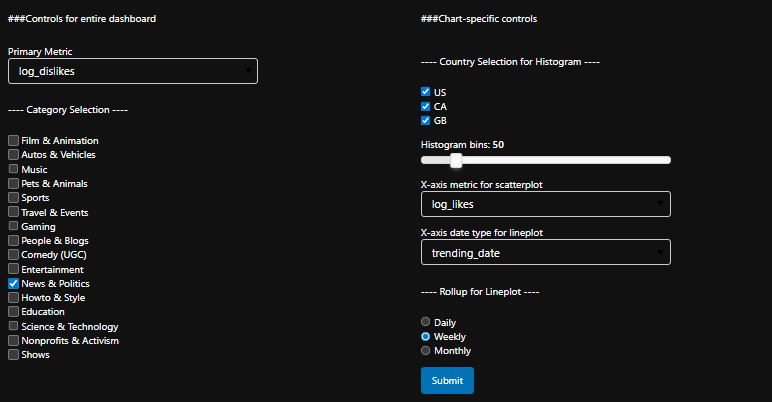

**Dashboard** 

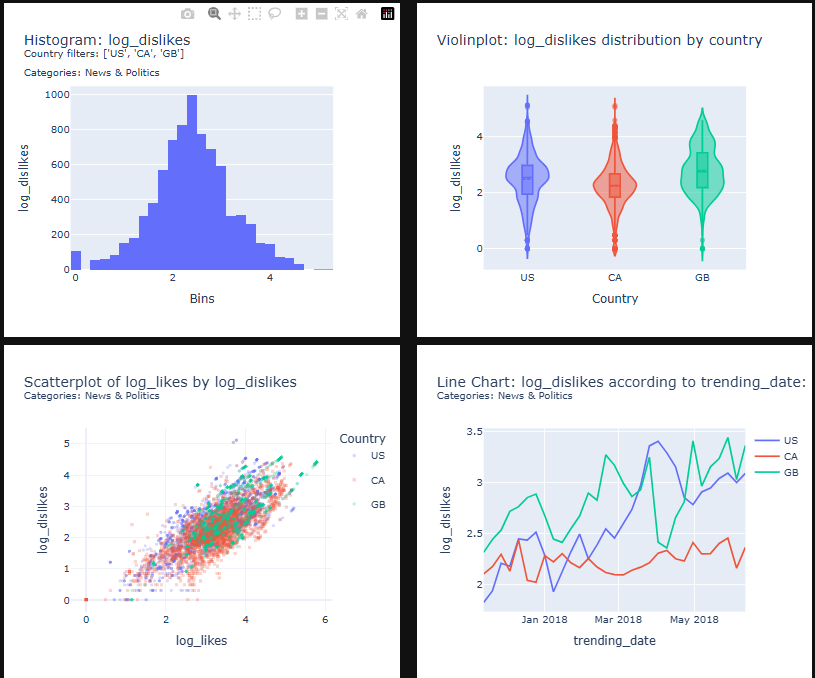

This dashboard provides a deep dive into how log-transformed dislikes vary across countries and time for the News & Politics category, using data from the United States, Canada, and Great Britain.

🔧 Control Settings:
* **Primary Metric (Y-axis)**: log_dislikes
* **Categories Filtered**: News & Politics only
* **Countries Filtered (for Histogram)**: US, CA, GB
* **Histogram Bins**: 50
* **Scatter X-axis Metric**: log_likes
* **Line Chart X-axis Date**: trending_date
* **Line Chart Time Rollup**: Daily

### Analysis
* In the **Histogram** you can see that the ***log dislikes*** are roughly bell-shaped and normally distributed, with a common range of hundreds to thousands of dislikes per video. The long tail suggests a few highly disliked videos
* In the **ViolinPlot** the US and GB show higher median dislike counts than CA. GB has a far wider violin and suggests greater variability in viewer reaction. The higher interquartile range suggests a stronger polarization in GB than US and Canada!
* In the **Scatterplot** there is a clear positive correlation between log_likes and log_dislikes, with all three countries showing the same trend. High engagement on both ends suggest polarization all around
* Finally, in the **line chart** suggests an upward trend in dislikes, during the Q1 and Q2 2018 time period for the US. CA is mostly flat -- and they tend to dislike videos at a lower rate, while GB is very erratic and presides over a higher baseline of log_dislikes than either country. Who knew the Brits were so apt to disliking YT videos!

If you switch the line plot to monthly, you'll see the increase in log_dislikes much more starkly:

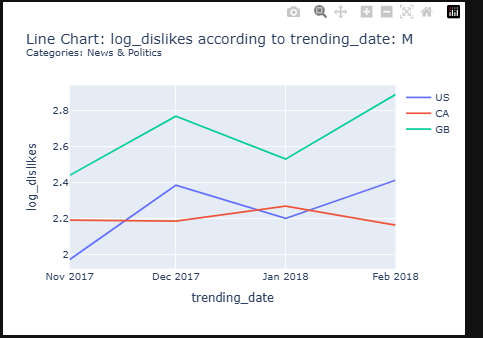

It seems the US and GB are increasing the volume of dislikes over the time period, while CA remains constant.

When we switch the primary metric to dislike/views, it's interesting to see that all three have right-skewed ratios, but US and CA are more extreme in their right-skew compared to GB:

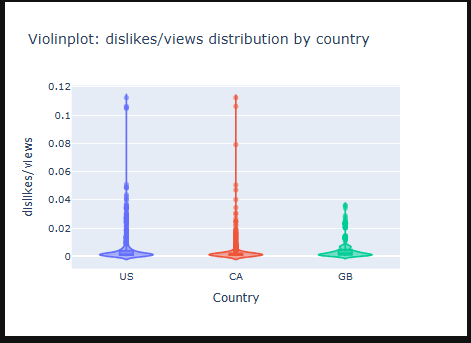

Hmm, how do we reconcile the fact that GB has a larger log_dislikes but a tamer dislike/views? Well, it's because they view far more YouTube than their US and CA counterparts:

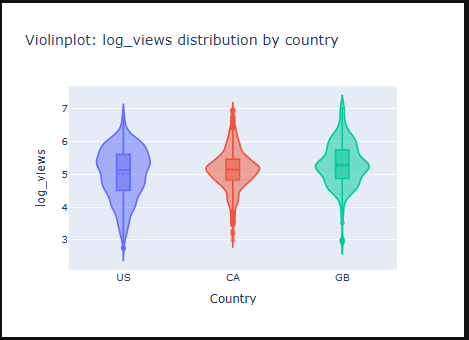

Finally, if you switch to a scatterplot that maps log views (x-axis) to dislike/views(y-axis):

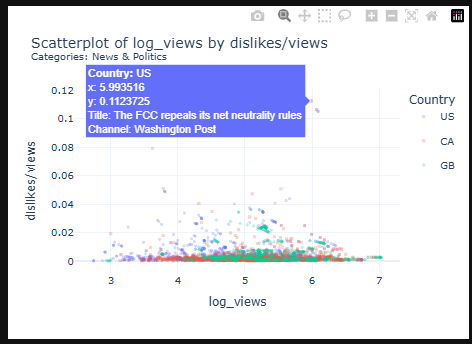

It's interesting to see that the most dislike-concentrated video are the FCC Net Neutrality repeals during this period.